In [1]:
using Knet
# using JLD2
using FileIO
using AutoGrad
using Images
using ImageMagick
using Random
using PyPlot
using Statistics
import Base: length, size, iterate, eltype, IteratorSize, IteratorEltype, haslength, @propagate_inbounds, repeat, rand, tail
import .Iterators: cycle, Cycle, take
using IterTools: ncycle, takenth
import CUDA
using NPZ
import Knet.Ops20: conv4x
include("layers_BlockGAN_v2.jl")
include("rotation_utils.jl")
include("BlockGAN_model.jl")
include("utils.jl")
array_type=(CUDA.functional() ? KnetArray{Float64} : Array{Float64})
atype() = array_type
atype(x) = convert(atype(),x)

atype (generic function with 2 methods)

In [18]:
# # array_type=Array{Float64}
# array_type=(CUDA.functional() ? KnetArray{Float64} : Array{Float64})
# atype() = array_type
# atype(x) = convert(atype(),x)

In [19]:
# dataset = load("dataset//singleObjects64Array.jld", "data");
# dataTrn = atype(dataset);

In [2]:
function load_image(filename)
    img = load(filename)
    img = imresize(img, (64,64))
    img = Float64.(channelview(img))
    img = img[1:3,:,:]
    img = permutedims(img, [2, 3, 1])
    img = img .* 2 .- 1
end

struct PhotoShapeChairs
    images
    batchsize::Int
    num_instances::Int
    shuffle::Bool
    function PhotoShapeChairs(datasetPaths; batchsize::Int=32, shuffle::Bool=false)
        nFullBatches, rem = divrem(size(datasetPaths)[end], batchsize)
        new(datasetPaths[1:nFullBatches*batchsize], batchsize, nFullBatches*batchsize, shuffle)
    end
end

function length(d::PhotoShapeChairs)
    nFullBatches, rem = divrem(d.num_instances, d.batchsize)
    nFullBatches + (rem > 0)*1
end

function iterate(d::PhotoShapeChairs, state=ifelse(d.shuffle, randperm(d.num_instances), collect(1:d.num_instances)))
    if length(state) > 0
        imgBatch = load_image.(d.images[state[1:(length(state) < d.batchsize ? end : d.batchsize)]])
        batch = cat(imgBatch..., dims = 4)
        state  = state[d.batchsize+1:end]
        return atype(batch), state
    end
end

iterate (generic function with 442 methods)

In [5]:

# function main()
#     i = 0
#     for real_image in ncycle(clevrDataset, 10)
#         bs = size(real_image)[end]
#         z = Z_Sample(zdim,bs)
#         z2 = Z_Sample(zdim2,bs)
#         view_fg = viewSample_fg(bs)
#         view_bg = viewSample_bg(bs)
#         if i % 25 == 0
#             push!(loss_g, gLoss(G, D, z, z2, view_fg, view_bg))
#             push!(loss_d, dLoss(D, real_image, G(z, z2, view_fg, view_bg)))
#             print("$(i): GenLoss: ");print(loss_g[end])
#             print("    DisLoss: ");print(loss_d[end])
#             push!(acc_d_real, dAccReal(D, real_image))
#             push!(acc_d_fake, dAccFake(G,D,z, z2, view_fg, view_bg))
#             print("    AccReal: ");print(acc_d_real[end])
#             print("    AccFake: ");println(acc_d_fake[end])
#         end
#         adam!(dLoss, [(D, real_image, G(z, z2, view_fg, view_bg))], gclip = 5, lr = 0.0001, beta1=0.5, params=params(D))
        
#         adam!(gLoss, [(G, D, z, z2, view_fg, view_bg)], params=params(G), gclip = 5, lr = 0.0001,beta1=0.5)
# #         adam!(gLoss, [(G, D, z, z2, view_fg, view_bg)], params=params(G), gclip = 5, lr = 0.0001,beta1=0.5)
#         i += 1
#     end
# end

viewSample_bg (generic function with 1 method)

In [21]:
function main()
    i = 0
    clevrDatasetVal = PhotoShapeChairs(dataPath, batchsize=bs, shuffle=true)
#     realImgVal = first(clevrDatasetVal) 
    for real_image in ncycle(clevrDataset, 10)
        bs = size(real_image)[end]
#         gloss = 0
#         dloss = 0
#         accF = 0
#         accR = 0
        if i % 25 == 0
            z = Z_Sample(zdim,bs)
            z2 = Z_Sample(zdim2,bs)
            view_fg = viewSample_fg(bs)
            view_bg = viewSample_bg(bs)
            for (j,realImgVal) in enumerate(clevrDatasetVal)
                gloss += gLoss(G, D, z, z2, view_fg, view_bg)
                dloss += dLoss(D, realImgVal, G(z, z2, view_fg, view_bg))
                accR += dAccReal(D, realImgVal)
                accF += dAccFake(G,D,z, z2, view_fg, view_bg)
                if j == 10
                    gloss /= j
                    dloss /= j
                    accR /= j
                    accF /= j
                    break
                end
            end
            push!(loss_g, gloss)
            push!(loss_d, dloss)
            push!(acc_d_real, accR)
            push!(acc_d_fake, accF)
#             push!(loss_g, gLoss(G, D, z, z2, view_fg, view_bg))
#             push!(loss_d, dLoss(D, realImgVal, G(z, z2, view_fg, view_bg)))
            print("$(i): GenLoss: ");print(loss_g[end])
            print("    DisLoss: ");print(loss_d[end])
#             push!(acc_d_real, dAccReal(D, realImgVal))
#             push!(acc_d_fake, dAccFake(G,D,z, z2, view_fg, view_bg))
            print("    AccReal: ");print(acc_d_real[end])
            print("    AccFake: ");println(acc_d_fake[end])
        end
        z = Z_Sample(zdim,bs)
        z2 = Z_Sample(zdim2,bs)
        view_fg = viewSample_fg(bs)
        view_bg = viewSample_bg(bs)
        
        adam!(dLoss, [(D, real_image, G(z, z2, view_fg, view_bg))], gclip = 5, lr = 0.0001, beta1=0.5, params=params(D))
        adam!(gLoss, [(G, D, z, z2, view_fg, view_bg)], params=params(G), gclip = 5, lr = 0.0001,beta1=0.5)
        adam!(gLoss, [(G, D, z, z2, view_fg, view_bg)], params=params(G), gclip = 5, lr = 0.0001,beta1=0.5)
        
        i += 1
    end
end

main (generic function with 1 method)

In [172]:
logits = atype(npzread("Weights_BlockGAN//logits.npy"))
logits = permutedims(logits, (2,1));
@gcheck1 myLoss(Param(logits))

(pa, xi, f0, nd, ad) = ("1×32 Param{KnetArray{Float64,2}}", 0.4522794783115387, 22.985123505490364, -0.38881881892979275, -0.3888189365421577)


true

In [168]:
ent = myLoss(logits)
[println(ent[i]) for i = 1:32];

0.7241484983821181
0.4123494116386584
1.4432254821292647
0.8716789653812991
0.46898471596844427
0.53452914761009
0.9153616094096586
0.3902575155261755
0.7089424563026743
0.5733423654503499
0.20377206527003058
0.5648337404091575
0.5599883311670697
0.615469382203831
1.7390369571893303
0.7467207653531529
0.9063663606754149
0.49236202417222674
0.11866419449969756
1.7273176975618105
0.677018791395039
0.16071701448894832
0.7583347157576102
1.4926747173714383
0.6822315328580139
0.47557865340664945
1.0643220096117627
0.5020389738417732
1.4000380549052298
0.17855244506935772
0.5059767531191561
0.37028815736492915


In [8]:
# w = atype(npzread("Weights_BlockGAN//wz.npy"))
# w = permutedims(w, (2,1))
# z = atype(npzread("Weights_BlockGAN//z.npy"))
# z = permutedims(z, (2,1))
# h1 = atype(npzread("Weights_BlockGAN//h1.npy"))
# h1 = permutedims(h1, (2,3,4,5,1))

# h1 = Knet.atype(npzread("Weights_BlockGAN//h1.npy"))
# h1 = permutedims(h1, (2,3,4,5,1));

# len = length(size(h1))
# mu = mean(h1, dims=collect(1:len-2))
# variance = var(h1, dims=collect(1:len-2));

In [9]:
# w2 = atype(npzread("Weights_BlockGAN//w_h2_2d.npy"))
# w3 = atype(npzread("Weights_BlockGAN//w_h3.npy"))
# w4 = atype(npzread("Weights_BlockGAN//w_h4.npy"))
# w5 = atype(npzread("Weights_BlockGAN//w_h5.npy"))
# h2_2d = npzread("Weights_BlockGAN//h2_2d.npy")
# h2_2d = atype(permutedims(h2_2d, (2,3,4,1)))

# h2 = npzread("Weights_BlockGAN//h2.npy")
# h2 = atype(permutedims(h2, (2,3,4,5,1)))

# h2_2d = permutedims(h2, (4,3,2,1,5))
# h2_2d = reshape(h2_2d, 16*64,16,16,:)
# h2_2d = permutedims(h2_2d, (3,2,1,4))

# upconv1 = Deconv(1,1,64,1024,identity)
# upconv2 = Deconv2(4,4,64,64,identity)
# upconv3 = Deconv2(4,4,64,64,identity)
# upconv4 = Deconv3(4,4,3,64,identity)
# upconv1.w = w2
# upconv2.w = w3
# upconv3.w = w4
# upconv4.w = w5

# a = upconv4(upconv3(upconv2(upconv1(h2_2d))))
# a[50,:,2,2]

In [3]:
Random.seed!(1245)
loss_g = []
loss_d = []
acc_d_real = []
acc_d_fake = []
bs = 32
zdim = 90
zdim2 = 60
imsize = 64
dataPath = "//datasets/photoshape_chairs//all_photoshape_chairs_large"
files = readdir(dataPath);
singleObj = files[endswith.(files, ".png")]
dataPath = ["$(dataPath)//$(file)" for file in singleObj];
skew_matrix = compute_skew_matrix_nearFar(bs, 16, 16; focal_length=35, sensor_size=32, distance = 11);
clevrDataset = PhotoShapeChairs(dataPath, batchsize=bs, shuffle=true)
G = Generator(zdim, zdim2, bs, imsize, skew_matrix)
D = Discriminator(Conv(5,5,3,imsize), Conv(5,5,imsize,imsize*2) , InstanceNorm(imsize*2), Conv(5,5,imsize*2,imsize*4), InstanceNorm(imsize*4), Conv(5,5,imsize*4,imsize*8), InstanceNorm(imsize*8), Dense(4*4*imsize*8,1,identity))
# D = Discriminator(Conv(5,5,3,imsize), Conv_spectral(5,5,imsize,imsize*2), InstanceNorm(imsize*2), Conv_spectral(5,5,imsize*2,imsize*4), InstanceNorm(imsize*4), Conv_spectral(5,5,imsize*4,imsize*8), InstanceNorm(imsize*8), Dense(4*4*imsize*8,1,identity))

Discriminator((Conv(P(KnetArray{Float64,4}(5,5,3,64)), P(KnetArray{Float64,4}(1,1,64,1)), leakyRelu), Conv(P(KnetArray{Float64,4}(5,5,64,128)), P(KnetArray{Float64,4}(1,1,128,1)), leakyRelu), InstanceNorm(P(KnetArray{Float64,4}(1,1,128,1)), P(KnetArray{Float64,4}(1,1,128,1))), Conv(P(KnetArray{Float64,4}(5,5,128,256)), P(KnetArray{Float64,4}(1,1,256,1)), leakyRelu), InstanceNorm(P(KnetArray{Float64,4}(1,1,256,1)), P(KnetArray{Float64,4}(1,1,256,1))), Conv(P(KnetArray{Float64,4}(5,5,256,512)), P(KnetArray{Float64,4}(1,1,512,1)), leakyRelu), InstanceNorm(P(KnetArray{Float64,4}(1,1,512,1)), P(KnetArray{Float64,4}(1,1,512,1))), Dense(P(KnetArray{Float64,2}(1,8192)), P(KnetArray{Float64,1}(1)), identity)))

In [201]:
img = first(clevrDataset);

In [16]:
macro gcheck1(ex); esc(:(@gcheck $ex (delta=0.000001, nsample=2, rtol=0.05, atol=0.001, verbose=1))); end

@gcheck1 (macro with 1 method)

In [4]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg(bs)
view_bg = viewSample_bg(bs)
# z = Param(z)
# z2 = Param(z2)
# view_fg = Param(view_fg)
# view_bg = Param(view_bg)
@gcheck1 gLoss(G, D, z, z2, view_fg, view_bg)
# @gcheck1 G(z, z2, view_fg, view_bg)

6×32 Array{Float64,2}:
 0.0       0.0174533  0.0       0.0       …  0.0174533  0.0174533  0.0
 0.785398  0.767945   0.785398  0.785398     0.785398   0.767945   0.767945
 1.0       1.0        1.0       1.0          1.0        1.0        1.0
 0.0       0.0        0.0       0.0          0.0        0.0        0.0
 0.0       0.0        0.0       0.0          0.0        0.0        0.0
 0.0       0.0        0.0       0.0       …  0.0        0.0        0.0

In [12]:
h2 = Param(atype(randn(16,16,16,64,32)))
@gcheck1 tf_3D_transform_skew(h2, view_fg, skew_matrix, 16, 16; shapenet_viewer=false)

true

In [13]:
@gcheck1 D(Param(img))


Stacktrace:
 [1] (::var"#23#24")() at /kuacc/users/aanees20/.julia/packages/AutoGrad/VFrAv/test/gradcheck.jl:172
 [2] gcsum(::Function; o::Base.Iterators.Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}) at /kuacc/users/aanees20/.julia/packages/AutoGrad/VFrAv/test/gradcheck.jl:50
 [3] gcsum at /kuacc/users/aanees20/.julia/packages/AutoGrad/VFrAv/test/gradcheck.jl:50 [inlined]
 [4] (::AutoGrad.var"#220#225"{Tuple{},var"#23#24",Tuple{}})() at /kuacc/users/aanees20/.julia/packages/AutoGrad/VFrAv/src/core.jl:205
 [5] differentiate(::Function; o::Base.Iterators.Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}) at /kuacc/users/aanees20/.julia/packages/AutoGrad/VFrAv/src/core.jl:144
 [6] differentiate at /kuacc/users/aanees20/.julia/packages/AutoGrad/VFrAv/src/core.jl:135 [inlined]
 [7] gcheck(::Function; kw::Tuple{}, nsample::Int64, verbose::Int64, rtol::Float64, atol::Float64, delta::Float64) at /kuacc/users/aanees20/.julia/packages/AutoGrad/VFrAv/test/gradcheck.jl:158
 [8] top-l

LoadError: UndefVarError: img not defined

In [20]:
[println(params(G)[i]) for i = 1:length(params(G))];

P(KnetArray{Float64,5}(4,4,4,512,1))
P(KnetArray{Float64,5}(3,3,3,128,512))
P(KnetArray{Float64,5}(1,1,1,128,1))
P(KnetArray{Float64,5}(3,3,3,64,128))
P(KnetArray{Float64,5}(1,1,1,64,1))
P(KnetArray{Float64,2}(1024,90))
P(KnetArray{Float64,1}(1024))
P(KnetArray{Float64,2}(256,90))
P(KnetArray{Float64,1}(256))
P(KnetArray{Float64,2}(128,90))
P(KnetArray{Float64,1}(128))
P(KnetArray{Float64,5}(4,4,4,256,1))
P(KnetArray{Float64,5}(3,3,3,128,256))
P(KnetArray{Float64,5}(1,1,1,128,1))
P(KnetArray{Float64,5}(3,3,3,64,128))
P(KnetArray{Float64,5}(1,1,1,64,1))
P(KnetArray{Float64,2}(512,60))
P(KnetArray{Float64,1}(512))
P(KnetArray{Float64,2}(256,60))
P(KnetArray{Float64,1}(256))
P(KnetArray{Float64,2}(128,60))
P(KnetArray{Float64,1}(128))
P(KnetArray{Float64,4}(1,1,64,1024))
P(KnetArray{Float64,4}(1,1,64,1))
P(KnetArray{Float64,4}(4,4,64,64))
P(KnetArray{Float64,4}(1,1,64,1))
P(KnetArray{Float64,4}(4,4,64,64))
P(KnetArray{Float64,4}(1,1,64,1))
P(KnetArray{Float64,4}(4,4,3,64))
P(KnetArray{Flo

In [65]:
params(D)

16-element Array{Param,1}:
 P(KnetArray{Float64,4}(5,5,3,64))
 P(KnetArray{Float64,4}(1,1,64,1))
 P(KnetArray{Float64,4}(5,5,64,128))
 P(KnetArray{Float64,4}(1,1,128,1))
 P(KnetArray{Float64,4}(1,1,128,1))
 P(KnetArray{Float64,4}(1,1,128,1))
 P(KnetArray{Float64,4}(5,5,128,256))
 P(KnetArray{Float64,4}(1,1,256,1))
 P(KnetArray{Float64,4}(1,1,256,1))
 P(KnetArray{Float64,4}(1,1,256,1))
 P(KnetArray{Float64,4}(5,5,256,512))
 P(KnetArray{Float64,4}(1,1,512,1))
 P(KnetArray{Float64,4}(1,1,512,1))
 P(KnetArray{Float64,4}(1,1,512,1))
 P(KnetArray{Float64,2}(1,8192))
 P(KnetArray{Float64,1}(1))

In [23]:
main()

0: GenLoss: 0.7114789663088691    DisLoss: 16.58384095466861    AccReal: 0.965625    AccFake: 0.125
25: GenLoss: 23.591935403523703    DisLoss: 0.01402449444222818    AccReal: 1.0    AccFake: 1.0
50: GenLoss: 33.72645181942197    DisLoss: 0.0029005362685119093    AccReal: 0.996875    AccFake: 1.0
75: GenLoss: 34.49439005571243    DisLoss: 1.8175536351939334e-5    AccReal: 1.0    AccFake: 1.0
100: GenLoss: 37.5060166950995    DisLoss: 0.010285593416608016    AccReal: 0.996875    AccFake: 1.0
125: GenLoss: 35.568828389115524    DisLoss: 0.21554750619585245    AccReal: 0.99375    AccFake: 0.9375
150: GenLoss: 40.466074106492144    DisLoss: 0.026136251193602043    AccReal: 0.99375    AccFake: 1.0
175: GenLoss: 38.49931106394053    DisLoss: 0.014920934539334579    AccReal: 0.996875    AccFake: 1.0
200: GenLoss: 38.371392678937106    DisLoss: 2.849430766220071e-7    AccReal: 1.0    AccFake: 1.0
225: GenLoss: 38.765849023275145    DisLoss: 9.805531532695504e-7    AccReal: 1.0    AccFake: 1.0


LoadError: InterruptException:

In [ ]:
main()

0: GenLoss: 1.0993648782283405    DisLoss: 1.9568509767818913    AccReal: 0.215625    AccFake: 0.75
25: GenLoss: 6.041955954238479    DisLoss: 0.009077114401866945    AccReal: 1.0    AccFake: 1.0
50: GenLoss: 10.559180445478587    DisLoss: 0.0028762223949059394    AccReal: 1.0    AccFake: 1.0
75: GenLoss: 5.962221579133788    DisLoss: 0.007164698215801448    AccReal: 1.0    AccFake: 1.0
100: GenLoss: 7.178747776777252    DisLoss: 0.0028861360959059985    AccReal: 1.0    AccFake: 1.0
125: GenLoss: 7.770591664873509    DisLoss: 0.0033199345333991353    AccReal: 1.0    AccFake: 1.0
150: GenLoss: 14.489740244098893    DisLoss: 0.2671919996208821    AccReal: 0.91875    AccFake: 1.0
175: GenLoss: 11.346829695543878    DisLoss: 0.15530764427555838    AccReal: 0.953125    AccFake: 0.96875
200: GenLoss: 11.009504635886715    DisLoss: 0.21175114267610268    AccReal: 0.91875    AccFake: 1.0
225: GenLoss: 10.788399508989485    DisLoss: 0.07933981449708857    AccReal: 0.959375    AccFake: 1.0
250: 

In [9]:
lg = copy(loss_g)
ld = copy(loss_d)
ar = copy(acc_d_real)
af = copy(acc_d_fake);


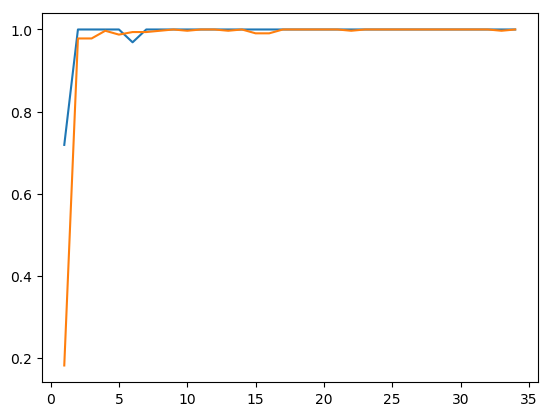

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x2ac8ef8066a0>

In [10]:
plot(1:size(af,1),af)
plot(1:size(ar,1),ar)

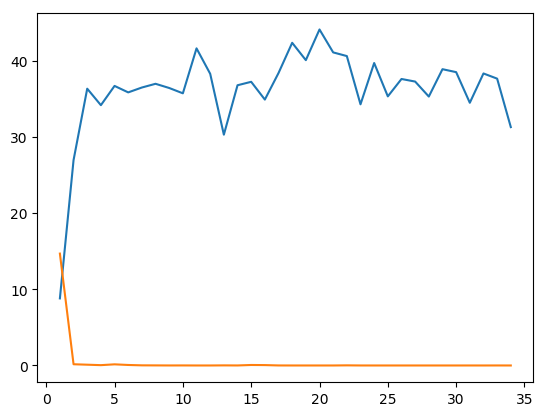

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x2ac8ef89cc88>

In [11]:
plot(1:size(lg,1),lg)
plot(1:size(ld,1),ld)

In [5]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg(bs)
view_bg = viewSample_bg(bs)

6×32 Array{Float64,2}:
 0.0174533  0.0       0.0       0.0       …  0.0174533  0.0       0.0174533
 0.785398   0.785398  0.767945  0.785398     0.785398   0.785398  0.785398
 1.0        1.0       1.0       1.0          1.0        1.0       1.0
 0.0        0.0       0.0       0.0          0.0        0.0       0.0
 0.0        0.0       0.0       0.0          0.0        0.0       0.0
 0.0        0.0       0.0       0.0       …  0.0        0.0       0.0

In [13]:
lg = copy(loss_g)
ld = copy(loss_d)
ar = copy(acc_d_real)
af = copy(acc_d_fake)

34-element Array{Any,1}:
 0.71875
 1.0
 1.0
 1.0
 1.0
 0.96875
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 ⋮
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0

In [6]:
function myGrid(images, rows, cols)
    images = convert(Array{Float32}, value(images))
    nIms = size(images)[end]
    k = 1
    big_img = zeros(64*rows, 64*cols, 3)
    big_img = convert(Array{Float32}, value(big_img))
    for i in 0:rows-1
        for j in 0:cols-1
            big_img[(64*i)+1:(64*(i+1)), (64*j)+1:(64*(j+1)),:] .= img[:,:,:,k]
            k+=1
            k > nIms && break
        end
    end
    big_img = (big_img .+ 1) ./ 2
#     big_img = big_img .- minimum(big_img)
#     big_img= big_img ./ maximum(big_img)
end

myGrid (generic function with 1 method)

In [ ]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

In [ ]:
size(big_img)

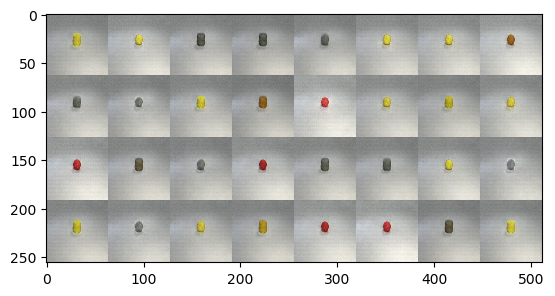

PyObject <matplotlib.image.AxesImage object at 0x2b872d5fb8d0>

In [19]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

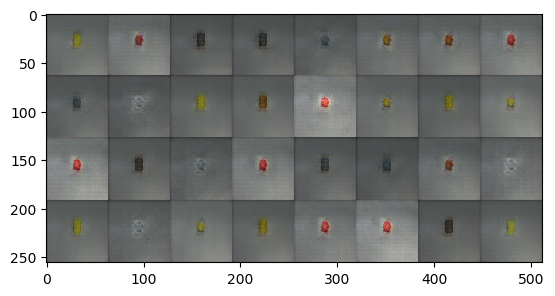

PyObject <matplotlib.image.AxesImage object at 0x2b872d663470>

In [21]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

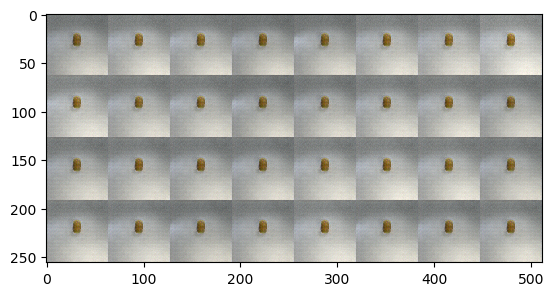

PyObject <matplotlib.image.AxesImage object at 0x2b872d6befd0>

In [23]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

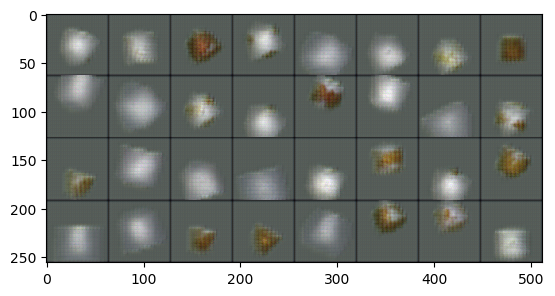

PyObject <matplotlib.image.AxesImage object at 0x2b0ee9c31748>

In [187]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

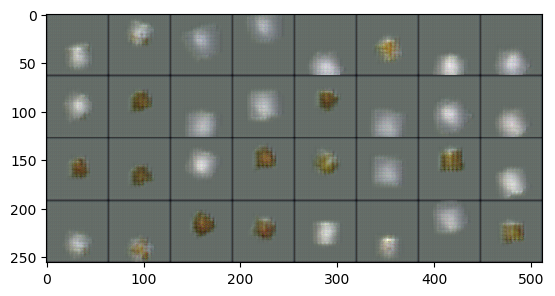

PyObject <matplotlib.image.AxesImage object at 0x2b0ee9ce9b38>

In [190]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

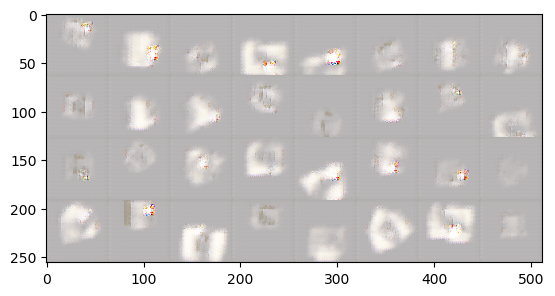

PyObject <matplotlib.image.AxesImage object at 0x2b0ee98e1940>

In [47]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

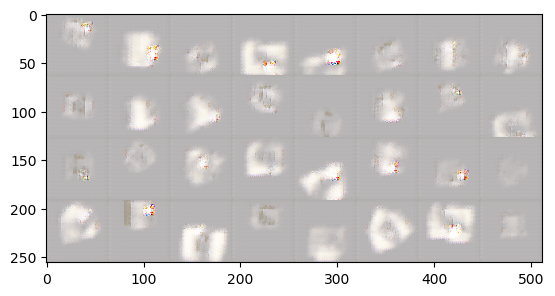

PyObject <matplotlib.image.AxesImage object at 0x2b0ee988e0f0>

In [45]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

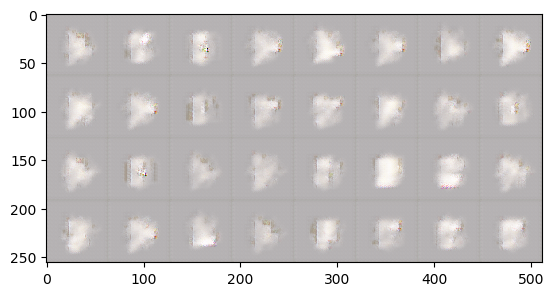

PyObject <matplotlib.image.AxesImage object at 0x2b0ee982a550>

In [42]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

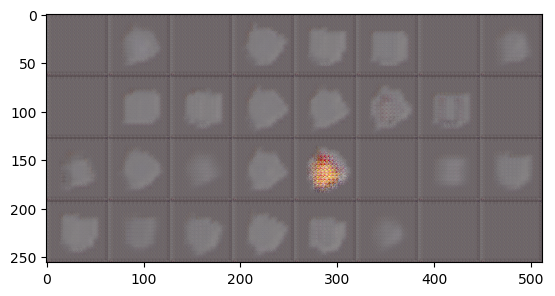

PyObject <matplotlib.image.AxesImage object at 0x2b0ee96bb7b8>

In [30]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

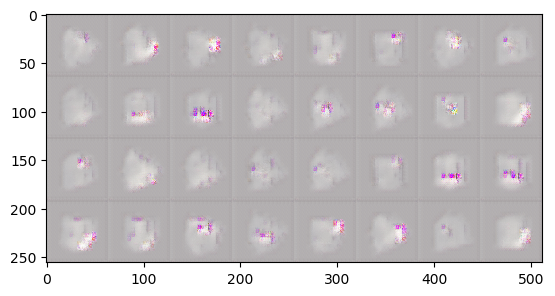

PyObject <matplotlib.image.AxesImage object at 0x2b0ee965bf28>

In [28]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

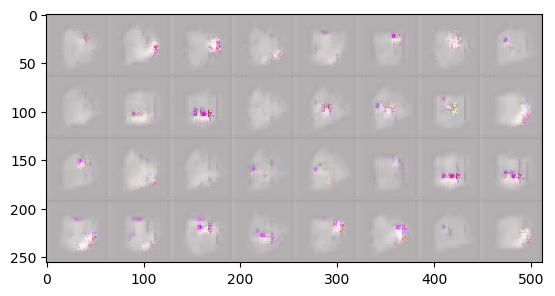

PyObject <matplotlib.image.AxesImage object at 0x2b0ee96053c8>

In [26]:
img = G(z, z2, view_fg, view_fg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

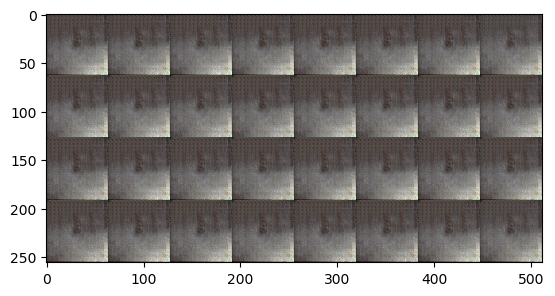

PyObject <matplotlib.image.AxesImage object at 0x2b44c55eb470>

In [58]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

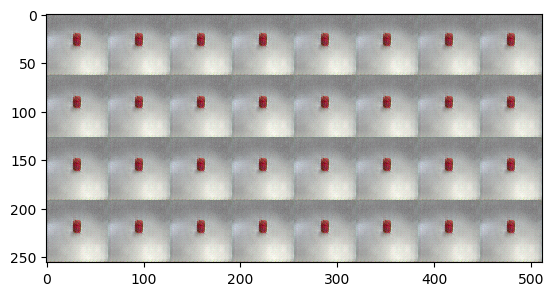

PyObject <matplotlib.image.AxesImage object at 0x2b44c5587358>

In [56]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

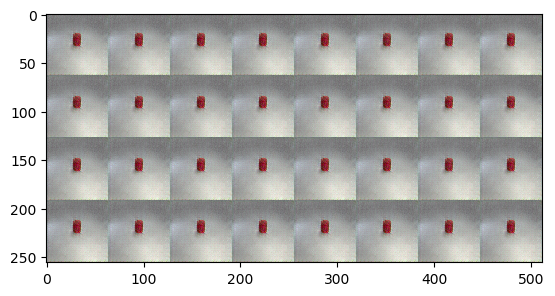

PyObject <matplotlib.image.AxesImage object at 0x2b44c55277b8>

In [54]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

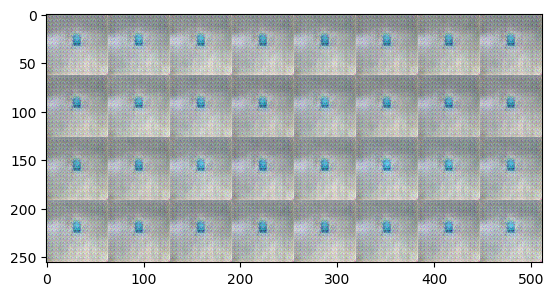

PyObject <matplotlib.image.AxesImage object at 0x2b44c5478550>

In [46]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

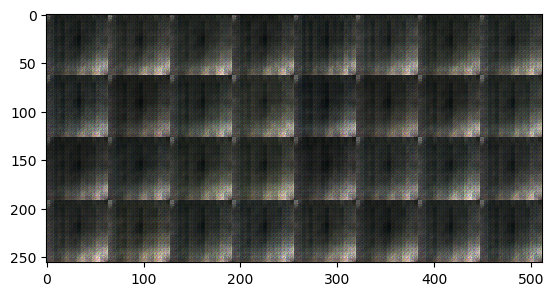

PyObject <matplotlib.image.AxesImage object at 0x2b44c540f9b0>

In [43]:
z = Z_Sample(zdim,bs)
z2 = Z_Samplse(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

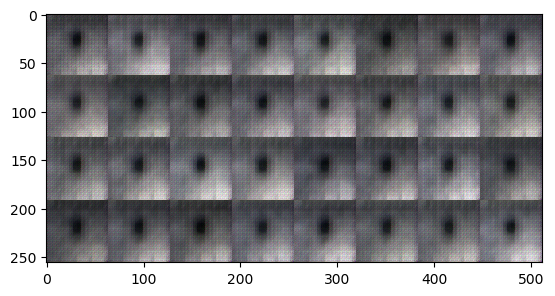

PyObject <matplotlib.image.AxesImage object at 0x2b44c52f5b38>

In [31]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

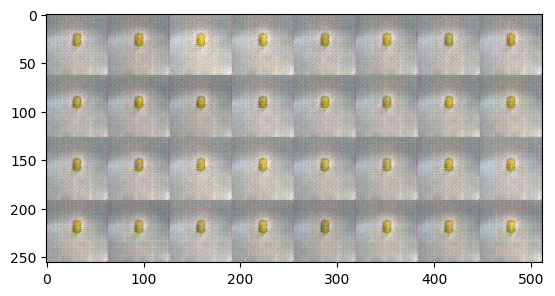

PyObject <matplotlib.image.AxesImage object at 0x2b44c529db38>

In [27]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

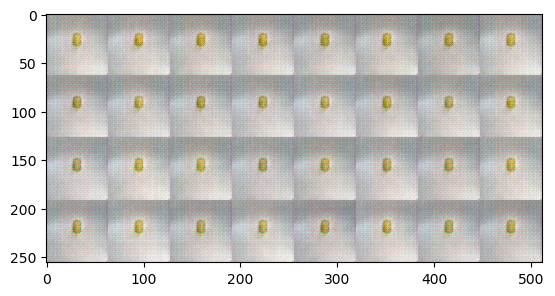

PyObject <matplotlib.image.AxesImage object at 0x2b44c520b080>

In [25]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

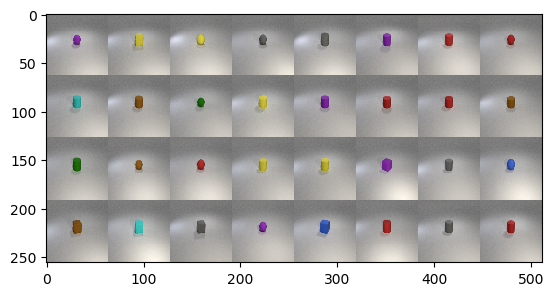

PyObject <matplotlib.image.AxesImage object at 0x2b89842a5c88>

In [165]:
img = first(clevrDataset)
big_img = myGrid(img, 4, 8)
imshow(big_img)

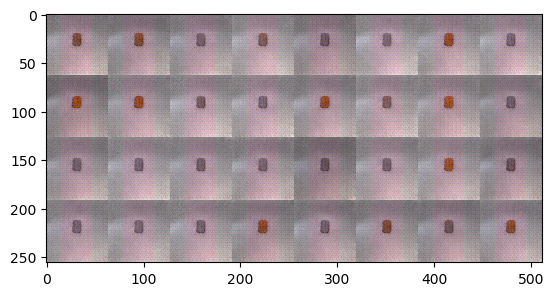

PyObject <matplotlib.image.AxesImage object at 0x2b8981f3e128>

In [123]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

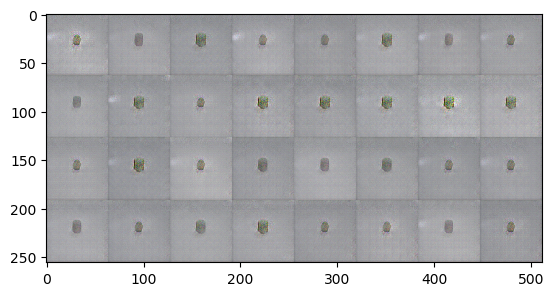

PyObject <matplotlib.image.AxesImage object at 0x2b8981c17128>

In [56]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

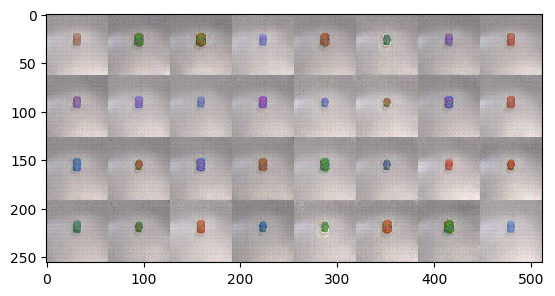

PyObject <matplotlib.image.AxesImage object at 0x2b8981b59128>

In [52]:
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

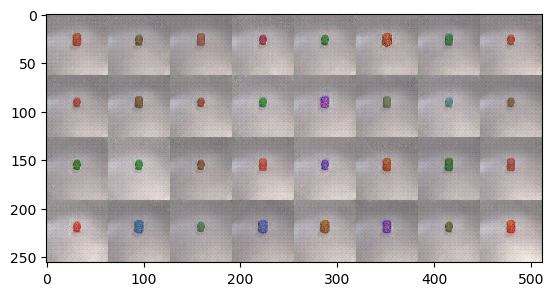

PyObject <matplotlib.image.AxesImage object at 0x2b8981a43320>

In [46]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

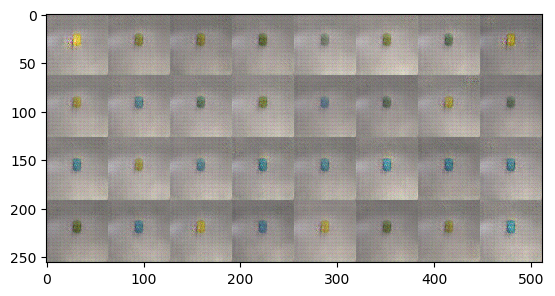

PyObject <matplotlib.image.AxesImage object at 0x2b898170d518>

In [25]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

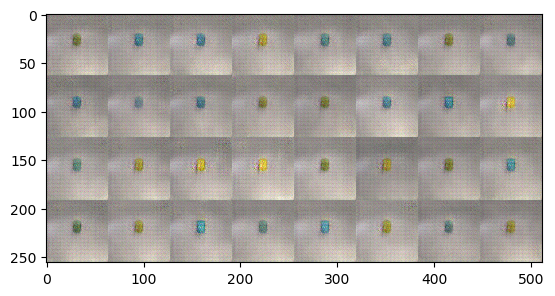

PyObject <matplotlib.image.AxesImage object at 0x2b89816a4978>

In [23]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

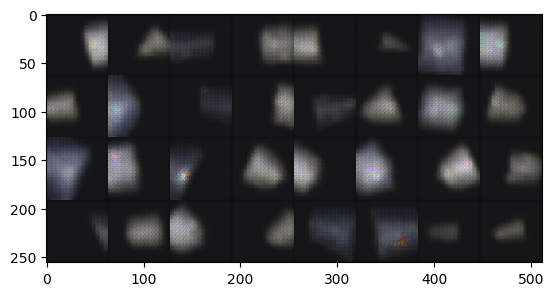

PyObject <matplotlib.image.AxesImage object at 0x2b8981644f60>

In [19]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

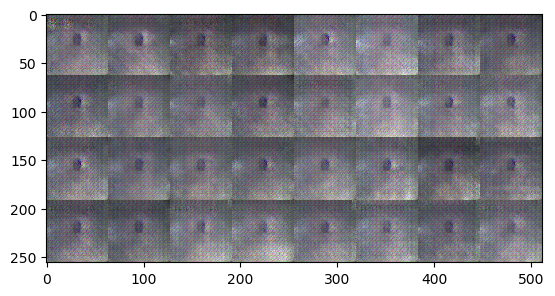

PyObject <matplotlib.image.AxesImage object at 0x2b8981599e10>

In [13]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

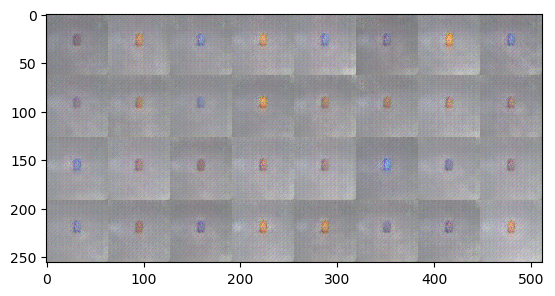

PyObject <matplotlib.image.AxesImage object at 0x2b898152fb00>

In [11]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

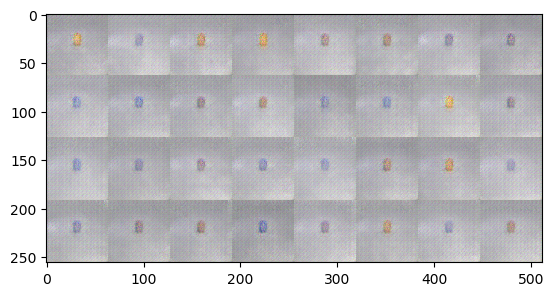

PyObject <matplotlib.image.AxesImage object at 0x2b898149f048>

In [9]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

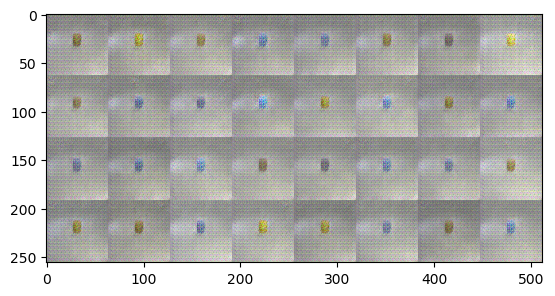

PyObject <matplotlib.image.AxesImage object at 0x2b27dd528978>

In [11]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

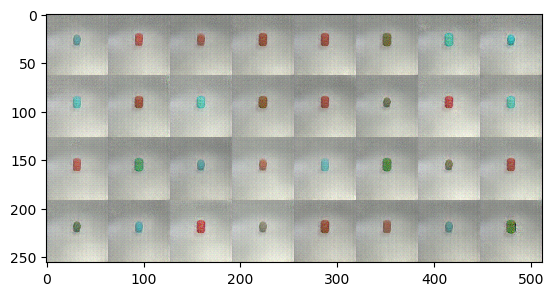

PyObject <matplotlib.image.AxesImage object at 0x2b83e149f048>

In [8]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

In [21]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)

64×64×3×2 KnetArray{Float32,4}:
[:, :, 1, 1] =
 -0.00153782   0.00635543    0.00121855   …   0.00738806    0.00514057
  0.00172785  -0.00104214    0.00253831       0.00933721    0.00489524
  0.00205215   0.0104922    -0.00116488       0.0089112    -0.00072602
  0.0153488    0.000526791  -0.00349127       0.000522866   0.015102
 -0.00809648  -0.00327073    0.00664362       0.00492299    0.00147679
 -0.00390329  -0.00171697    0.000746552  …   0.00830619    0.00213071
 -0.00560429   0.00478391   -0.00648768       0.0124045     0.00243676
  0.0107698    0.00223141    0.0128252       -0.00612835    0.0105062
 -0.00663478   0.00276993    0.0221813        0.00684155   -0.000225595
 -0.00926614   0.00472624    0.0022808        0.0112088    -0.00180485
 -0.00978171   0.00816323    0.0137225    …   0.0129792     0.000441897
  0.00573956   0.00340918    0.00560416       0.00668141    0.0140712
 -0.00526578   0.00979596    0.00974644       0.00418698   -0.00269893
  ⋮                             

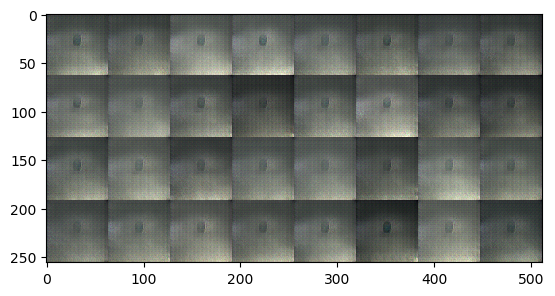

PyObject <matplotlib.image.AxesImage object at 0x2b83e1590c88>

In [12]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

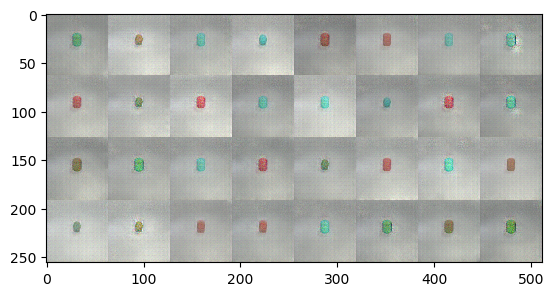

PyObject <matplotlib.image.AxesImage object at 0x2b83e1528978>

In [10]:
z = Z_Sample(zdim,bs)
z2 = Z_Sample(zdim2,bs)
view_fg = viewSample_fg()
view_bg = viewSample_bg()
img = G(z, z2, view_fg, view_bg)
big_img = myGrid(img, 4, 8)
imshow(big_img)

In [55]:
deconv1 = G.foreground.upconv1
deconv1.w = w

upconv1 = Deconv4(3,3,3,64*2,64*8,8,2)
upconv1.w = w

deconv1pyth = npzread("Weights_BlockGAN//deconv1.npy")
deconv1pyth = permutedims(deconv1pyth, (2,3,4,5,1))
deconv1pyth[1,1,:,:,1]

conv4x(w, KnetArray{Float32}(undef,8, 8, 8, 128, 2), h0, padding = 1, stride = 2, mode=1)

a = upconv1(h0)
a[1,:,:,1,1]

P(KnetArray{Float32,5}(3,3,3,128,512))

In [88]:
view_in = npzread("Weights_BlockGAN//view.npy")
view_in = permutedims(view_in, (2,1))
skew = npzread("Weights_BlockGAN//skew.npy")
skew = permutedims(skew, (2,3,1))
voxels = Knet.atype(npzread("Weights_BlockGAN//voxels.npy"))
voxels = permutedims(voxels, (2,3,4,5,1))
rotated = npzread("Weights_BlockGAN//rotated.npy")
rotated = permutedims(rotated, (2,3,4,5,1))

voxel = permutedims(voxels, (4,3,2,1,5))
voxel_flat = reshape(voxel, 64, :) # may need to transpose
voxel_flat = permutedims(voxel_flat, (2,1));

back = permutedims(voxel_flat, (2,1))
back = reshape(back, 64, 16, 16, 16, 2)
back = permutedims(back, (4,3,2,1,5))

rotatedMy = tf_3D_transform_skew(voxels, view_in, skew, 16, 16; shapenet_viewer=false)

match = transform_voxel_to_match_image(rotatedMy);

16×16×16×64×2 KnetArray{Float32,5}:
[:, :, 1, 1, 1] =
 0.0492545  0.0492545  0.0492545  …  0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545  …  0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545  …  0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0.0492545  0.0492545
 0.0492545  0.0492545  0.0492545     0.0492545  0

In [259]:
match = transform_voxel_to_match_image(rotatedMy)

16×16×16×64×2 KnetArray{Float32,5}:
[:, :, 1, 1, 1] =
  0.0          0.0          0.0         …  -7.45058f-9   -7.45058f-9
  1.49012f-8   0.0         -7.45058f-9     -7.45058f-9    0.0
  7.45058f-9   5.58794f-9   0.0            -3.72529f-9   -3.72529f-9
  1.49012f-8   0.0          0.0            -3.72529f-9   -3.72529f-9
  0.0          3.72529f-9   3.72893f-9      9.31323f-10  -6.51926f-9
 -3.72529f-9  -1.49012f-8   7.45058f-9  …  -4.88944f-9    0.0
  1.49012f-8   0.0          0.0             0.0          -9.31323f-10
 -3.72529f-9   1.86265f-9  -3.72529f-9      0.0492545    -9.31323f-10
  0.0          0.0          0.0             0.0           0.0
  0.0          0.0          0.0             0.0           0.0
  0.0          0.0          0.0         …   0.0           0.0
  0.0          0.0          0.0             0.0           0.0
  0.0          0.0          0.0             0.0           0.0
  0.0          0.0          0.0             0.0           0.0
  0.0          0.0          0.0   

In [272]:
h2_2d = permutedims(match, (4,3,2,1,5))
h2_2d = reshape(h2_2d, 16*64,16,16,:)
h2_2d = permutedims(h2_2d, (3,2,1,4));

In [275]:
h2_2d[:,6,551,2]

16-element KnetArray{Float32,1}:
 -1.1641532f-9
  0.0
  6.9849193f-10
  0.0
  0.027337406
  0.04102942
  0.052669648
  0.052753925
  0.05314189
  0.028021779
  0.061230518
  0.022951221
  0.025304548
  0.0
  0.0
  0.0

In [35]:
h0 = Knet.atype(npzread("Weights_BlockGAN//inputDeconv1.npy"))
h0 = permutedims(h0, (2,3,4,5,1))

w = Param(Knet.atype(npzread("Weights_BlockGAN//deconv1Weights.npy")))

4×4×4×512×2 KnetArray{Float32,5}:
[:, :, 1, 1, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 2, 1, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 3, 1, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 4, 1, 1] =
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0

[:, :, 1, 2, 1] =
 0.0355283  0.0        0.0        0.0442381
 0.0        0.045612   0.0        0.0174746
 0.0        0.0        0.0483762  0.0
 0.0        0.0158395  0.0567675  0.0171468

[:, :, 2, 2, 1] =
 0.0         0.0         0.0111073  0.0
 0.0         0.0232255   0.0        0.0
 0.023494    0.00872368  0.0109265  0.03147
 0.00855186  0.0239663   0.0450057  0.00406759

[:, :, 3, 2, 1] =
 0.0238293    0.00168524  0.0129119   0.0
 0.0223943    0.00149796  0.0         0.0
 0.0040393    0.0462709   0.0260399   0.0303405
 0.000136672  0.00196587  0.00423148  0.0